Columns in dataset: Index(['time', 'sqNum', 'stnum', 'state_cb', 'sqDiff', 'stDiff', 'timeLastMsg',
       'recentChange', 'MU1Cs', 'MU2Cs', 'MU3Cs', 'MU4Cs', 'Cs', 'consistency',
       'threePhaseVSum', 'threePhaseCSum', 'threePhaseVMU1',
       'MU1VoltageAngleA', 'MU1VoltageAngleB', 'MU1VoltageAngleC',
       'threePhaseCurrentMU1', 'MU1CurrentAngleA', 'MU1CurrentAngleB',
       'MU1CurrentAngleC', 'MU1Log', 'threePhaseVMU2', 'MU2VoltageAngleA',
       'MU2VoltageAngleB', 'MU2VoltageAngleC', 'threePhaseCMU2',
       'MU2CurrentAngleA', 'MU2CurrentAngleB', 'MU2CurrentAngleC', 'MU2Log',
       'threePhaseVMU3', 'MU3VoltageAngleA', 'MU3VoltageAngleB',
       'MU3VoltageAngleC', 'threePhaseCMU3', 'MU3CurrentAngleA',
       'MU3CurrentAngleB', 'MU3CurrentAngleC', 'MU3Log', 'threePhaseVMU4',
       'MU4VoltageAngleA', 'MU4VoltageAngleB', 'MU4VoltageAngleC',
       'threePhaseCMU4', 'IED4_iA', 'IED4_iB', 'IED4_iC', 'MU4Log',
       'any_relay', 'class'],
      dtype='object')
    time  sq

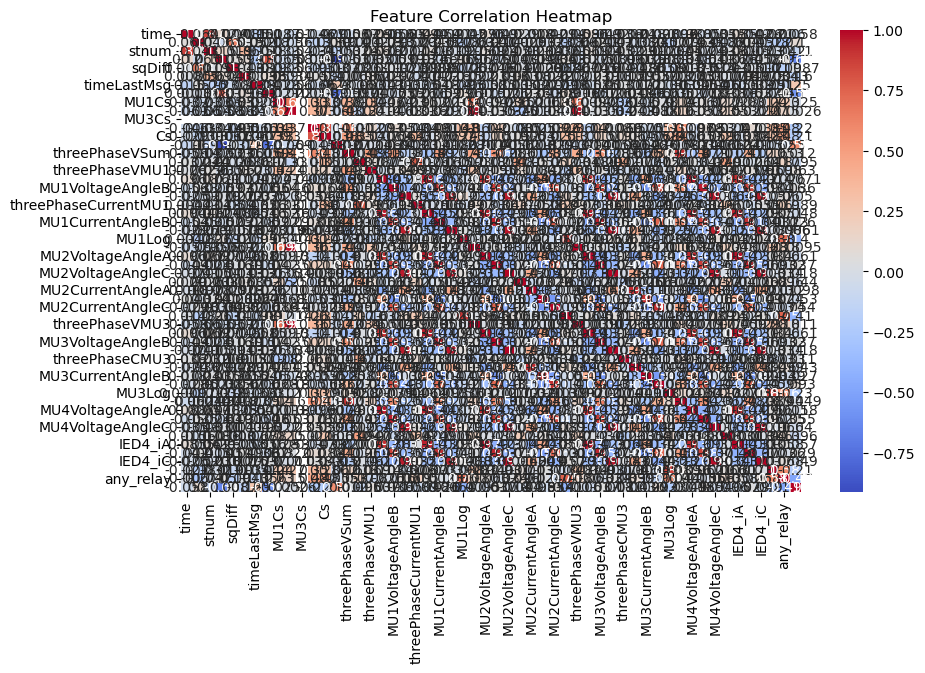

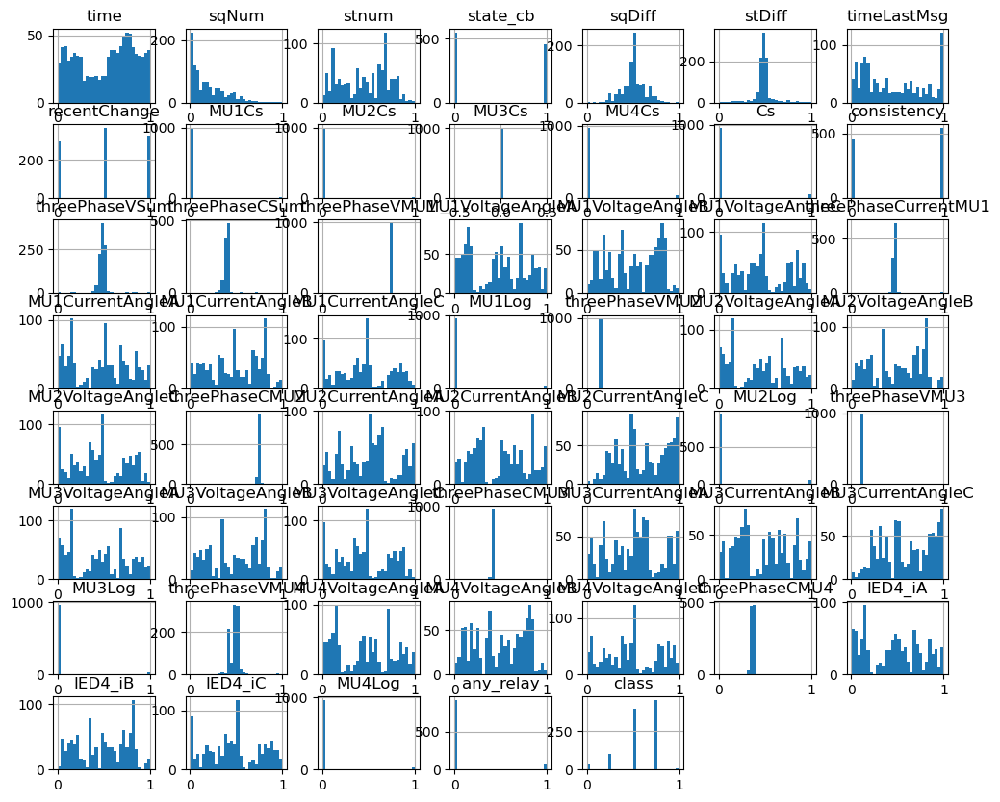

Data Preprocessing Completed ✅


In [2]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns




# Load dataset
df = pd.read_csv("/home/gagan/anaconda_projects/project/Train.csv",nrows=1000)

# Check column names
print("Columns in dataset:", df.columns)

# Identify the target column (assuming it's named 'Label' or similar)
target_column = 'class'  # Change this to the actual column name

# Convert categorical labels to numeric values
label_encoder = LabelEncoder()
df[target_column] = label_encoder.fit_transform(df[target_column])

# Convert all non-numeric data to numeric
df = df.apply(pd.to_numeric, errors='coerce')

# Drop rows with NaN values (if any)
df.dropna(inplace=True)

print(df.head())  # Verify the transformed dataset


# Display basic info
print("Dataset Overview:")
print(df.info())

# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())

# Handle Missing Values (Fill with Mean or Drop Rows)
df.fillna(df.mean(), inplace=True)

# Display summary statistics
print("\nSummary Statistics:")
print(df.describe())

# Data Normalization using Min-Max Scaling
scaler = MinMaxScaler()
numeric_cols = df.select_dtypes(include=[np.number]).columns
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

# Data Visualization
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

# Histogram of Features
df.hist(figsize=(12, 10), bins=30)
plt.show()

# Pairplot (For small datasets)
sns.pairplot(df.sample(100))
plt.show()

print("Data Preprocessing Completed ✅")



In [1]:
import psutil
print(f"Memory usage: {psutil.virtual_memory().percent}%")


Memory usage: 52.8%
